In [1]:
import os
os.chdir("C:/Users/zetru/OneDrive/Mémoire python/")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 16, 9
plt.rcParams['axes.grid'] = True
import geopandas as gpd

In [2]:
df=pd.read_hdf('df_v5.h5','df_v5')
df

,cp,id,nom_carburant,id_carburant,maj,valeur,litre_brut,type,latitude,longitude,ville,stations_rayon_5km,competition_geo
0,01,1000001,Gazole,1,2022-01-03,0.702500,0.435626,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
1,01,1000001,Gazole,1,2022-01-05,0.692500,0.447949,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
2,01,1000001,Gazole,1,2022-01-10,0.728333,0.452874,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
3,01,1000001,Gazole,1,2022-01-17,0.739167,0.484043,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
4,01,1000001,Gazole,1,2022-01-21,0.769167,0.497616,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4537444,95,95870010,SP98,6,2022-12-23,0.856233,0.488413,R,48.936,2.206,Bezons,15,4
4537445,95,95870010,SP98,6,2022-12-27,0.874567,0.487324,R,48.936,2.206,Bezons,15,4
4537446,95,95870010,SP98,6,2022-12-28,0.874567,0.484175,R,48.936,2.206,Bezons,15,4
4537447,95,95870010,SP98,6,2022-12-29,0.879567,0.477600,R,48.936,2.206,Bezons,15,4


In [3]:
df['nom_carburant'] = df['nom_carburant'].replace({'E10': 'SP95-E10'})

In [4]:
df[df['id_carburant']=='2']

,cp,id,nom_carburant,id_carburant,maj,valeur,litre_brut,type,latitude,longitude,ville,stations_rayon_5km,competition_geo
138,01,1000001,SP95,2,2022-01-03,0.695633,0.435626,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
139,01,1000001,SP95,2,2022-01-05,0.687300,0.447949,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
140,01,1000001,SP95,2,2022-01-06,0.693967,0.456551,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
141,01,1000001,SP95,2,2022-01-10,0.711467,0.452874,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
142,01,1000001,SP95,2,2022-01-17,0.716467,0.484043,R,46.201,5.198,SAINT-DENIS-LèS-BOURG,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4524784,95,95570003,SP95,2,2022-12-30,0.782067,0.486593,R,49.041,2.342,MOISSELLES,8,3
4526468,95,95600001,SP95,2,2022-01-03,0.723767,0.435626,R,48.978,2.291,EAUBONNE,16,4
4526469,95,95600001,SP95,2,2022-01-04,0.740433,0.442323,R,48.978,2.291,EAUBONNE,16,4
4526470,95,95600001,SP95,2,2022-10-28,0.821267,0.597232,R,48.978,2.291,EAUBONNE,16,4


In [5]:
prix_moyen_par_departement = df.groupby(['cp','nom_carburant'])['valeur'].mean().reset_index()
prix_moyen_par_departement

,cp,nom_carburant,valeur
0,01,E85,0.686455
1,01,GPLc,0.687420
2,01,Gazole,1.081977
3,01,SP95,0.949783
4,01,SP95-E10,0.932652
...,...,...,...
559,95,GPLc,0.651042
560,95,Gazole,1.085214
561,95,SP95,0.953559
562,95,SP95-E10,0.959443


In [6]:
import geopandas as gpd

In [7]:
gdf_departements=gpd.read_file("C:/Users/zetru/Downloads/departements-20140306-100m-shp/departements-20140306-100m.shp")

In [8]:
gdf_departements.drop(columns=['nom','nuts3','wikipedia'],inplace=True)

In [9]:
gdf_departements

,code_insee,geometry
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ..."
1,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ..."
2,03,"POLYGON ((2.38613 46.33196, 2.37909 46.32757, ..."
3,04,"POLYGON ((6.66579 43.83120, 6.67673 43.83178, ..."
4,05,"POLYGON ((6.24158 44.44686, 6.24783 44.44188, ..."
...,...,...
96,971,"MULTIPOLYGON (((-61.61403 15.83955, -61.61399 ..."
97,972,"MULTIPOLYGON (((-60.86880 14.39091, -60.86747 ..."
98,973,"MULTIPOLYGON (((-52.58463 5.28309, -52.58316 5..."
99,974,"MULTIPOLYGON (((55.77886 -21.36291, 55.77889 -..."


In [10]:
gdf_dep_merge=pd.merge(gdf_departements,prix_moyen_par_departement,left_on='code_insee',right_on='cp')
gdf_dep_merge

,code_insee,geometry,cp,nom_carburant,valeur
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,E85,0.686455
1,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,GPLc,0.687420
2,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,Gazole,1.081977
3,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP95,0.949783
4,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP95-E10,0.932652
...,...,...,...,...,...
559,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,GPLc,0.651042
560,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,Gazole,1.085214
561,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,SP95,0.953559
562,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,SP95-E10,0.959443


In [11]:
import folium

In [12]:
x='SP95-E10'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_SP95E10_par_département.html')
m

In [13]:
x='E85'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_{x}_par_département.html')
m

In [14]:
x='GPLc'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_{x}_par_département.html')
m

In [15]:
x='Gazole'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_{x}_par_département.html')
m

x='SP95'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_{x}_par_département.html')
m

In [16]:
x='SP98'
m = folium.Map(location=[46.2276, 2.2137], zoom_start=6)
folium.Choropleth(
    geo_data='limites_départements.json',  # Le chemin vers votre fichier GeoJSON
    name=f'{x}',
    data=gdf_dep_merge[gdf_dep_merge['nom_carburant']==f'{x}'],  # Votre DataFrame de prix moyens par département
    columns=['code_insee', 'valeur'],  # Remplacez par les noms de colonnes appropriés
    key_on='feature.properties.code_insee',  # Assurez-vous que cela correspond à la clé dans votre GeoJSON
    fill_color='Greens',  # Palette de couleurs (jaune, orange, rouge ici)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name=f'Prix moyen au détail du {x} par département en 2022'
    ).add_to(m)
m.save(f'maps/map_{x}_par_département.html')
m

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt

In [18]:
stations_par_département=pd.DataFrame(df.groupby('cp')['id'].nunique())

In [19]:
gdf=gpd.read_file("C:/Users/zetru/Downloads/departements-20140306-100m-shp/departements-20140306-100m.shp")

In [20]:
gdf.drop(columns=['nom','nuts3','wikipedia'],inplace=True)

In [21]:
gdf

,code_insee,geometry
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ..."
1,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ..."
2,03,"POLYGON ((2.38613 46.33196, 2.37909 46.32757, ..."
3,04,"POLYGON ((6.66579 43.83120, 6.67673 43.83178, ..."
4,05,"POLYGON ((6.24158 44.44686, 6.24783 44.44188, ..."
...,...,...
96,971,"MULTIPOLYGON (((-61.61403 15.83955, -61.61399 ..."
97,972,"MULTIPOLYGON (((-60.86880 14.39091, -60.86747 ..."
98,973,"MULTIPOLYGON (((-52.58463 5.28309, -52.58316 5..."
99,974,"MULTIPOLYGON (((55.77886 -21.36291, 55.77889 -..."


In [22]:
gdf_merge=gdf.merge(stations_par_département,left_on='code_insee',right_on='cp')
gdf_merge

,code_insee,geometry,id
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",111
1,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ...",90
2,03,"POLYGON ((2.38613 46.33196, 2.37909 46.32757, ...",78
3,04,"POLYGON ((6.66579 43.83120, 6.67673 43.83178, ...",52
4,05,"POLYGON ((6.24158 44.44686, 6.24783 44.44188, ...",45
...,...,...,...
89,91,"POLYGON ((2.39233 48.33593, 2.39376 48.32678, ...",131
90,92,"POLYGON ((2.31993 48.77075, 2.31588 48.76670, ...",74
91,93,"POLYGON ((2.41899 48.84939, 2.41636 48.84924, ...",88
92,94,"POLYGON ((2.41450 48.71780, 2.41573 48.72088, ...",81


In [23]:
%matplotlib inline
plt.rcParams['figure.figsize'] = 16, 9
plt.rcParams['axes.grid'] = True

In [24]:
df_pop=pd.read_excel("C:/Users/zetru/Downloads/estim-pop-dep-sexe-gca-1975-2023.xls",sheet_name='2022',usecols='A:T',skiprows=3)

In [25]:
df_pop

,Départements,Unnamed: 1,Ensemble,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Hommes,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Femmes,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19
0,NaN,NaN,0 à 19 ans,20 à 39 ans,40 à 59 ans,60 à 74 ans,75 ans et plus,Total,0 à 19 ans,20 à 39 ans,40 à 59 ans,60 à 74 ans,75 ans et plus,Total,0 à 19 ans,20 à 39 ans,40 à 59 ans,60 à 74 ans,75 ans et plus,Total
1,01,Ain,170644,149381,182322,108338,56286,666971,88209,75139,90734,51954,23046,329082,82435,74242,91588,56384,33240,337889
2,02,Aisne,127328,114151,133577,99174,50493,524723,65497,57506,66392,47415,19626,256436,61831,56645,67185,51759,30867,268287
3,03,Allier,66707,62330,83969,73059,47435,333500,34182,32022,41328,34263,18533,160328,32525,30308,42641,38796,28902,173172
4,04,Alpes-de-Haute-Provence,34085,30984,43372,35934,21823,166198,17542,15670,20900,17310,8917,80339,16543,15314,22472,18624,12906,85859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,976,Mayotte,160766,79525,45866,10172,2693,299022,79505,33401,23024,5313,1272,142515,81261,46124,22842,4859,1421,156507
103,DOM,NaN,700424,504461,552455,308091,130323,2195754,352372,227359,253845,145750,52975,1032301,348052,277102,298610,162341,77348,1163453
104,France métropolitaine et DOM,NaN,16079478,15912748,17452426,11789322,6608617,67842591,8235445,7880912,8560412,5535536,2609919,32822224,7844033,8031836,8892014,6253786,3998698,35020367
105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df_pop=df_pop.drop(df_pop.index[0])
df_pop

,Départements,Unnamed: 1,Ensemble,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Hommes,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Femmes,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19
1,01,Ain,170644,149381,182322,108338,56286,666971,88209,75139,90734,51954,23046,329082,82435,74242,91588,56384,33240,337889
2,02,Aisne,127328,114151,133577,99174,50493,524723,65497,57506,66392,47415,19626,256436,61831,56645,67185,51759,30867,268287
3,03,Allier,66707,62330,83969,73059,47435,333500,34182,32022,41328,34263,18533,160328,32525,30308,42641,38796,28902,173172
4,04,Alpes-de-Haute-Provence,34085,30984,43372,35934,21823,166198,17542,15670,20900,17310,8917,80339,16543,15314,22472,18624,12906,85859
5,05,Hautes-Alpes,28689,26531,36961,30567,17330,140078,14883,13521,18240,14697,7040,68381,13806,13010,18721,15870,10290,71697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,976,Mayotte,160766,79525,45866,10172,2693,299022,79505,33401,23024,5313,1272,142515,81261,46124,22842,4859,1421,156507
103,DOM,NaN,700424,504461,552455,308091,130323,2195754,352372,227359,253845,145750,52975,1032301,348052,277102,298610,162341,77348,1163453
104,France métropolitaine et DOM,NaN,16079478,15912748,17452426,11789322,6608617,67842591,8235445,7880912,8560412,5535536,2609919,32822224,7844033,8031836,8892014,6253786,3998698,35020367
105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df_pop=df_pop.iloc[:96,[0,7]]
df_pop

,Départements,Unnamed: 7
1,01,666971
2,02,524723
3,03,333500
4,04,166198
5,05,140078
...,...,...
92,91,1312419
93,92,1637090
94,93,1673645
95,94,1420404


In [28]:
df_pop=df_pop.rename(columns={'Unnamed: 7':'Population'})

In [29]:
gdf_stations_par_hab=pd.merge(gdf_merge,df_pop,left_on='code_insee',right_on='Départements')
gdf_stations_par_hab.drop('Départements',inplace=True,axis=1)
gdf_stations_par_hab

,code_insee,geometry,id,Population
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",111,666971
1,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ...",90,524723
2,03,"POLYGON ((2.38613 46.33196, 2.37909 46.32757, ...",78,333500
3,04,"POLYGON ((6.66579 43.83120, 6.67673 43.83178, ...",52,166198
4,05,"POLYGON ((6.24158 44.44686, 6.24783 44.44188, ...",45,140078
...,...,...,...,...
89,91,"POLYGON ((2.39233 48.33593, 2.39376 48.32678, ...",131,1312419
90,92,"POLYGON ((2.31993 48.77075, 2.31588 48.76670, ...",74,1637090
91,93,"POLYGON ((2.41899 48.84939, 2.41636 48.84924, ...",88,1673645
92,94,"POLYGON ((2.41450 48.71780, 2.41573 48.72088, ...",81,1420404


In [30]:
gdf_stations_par_hab['Stations_pour_100k_hab']=((gdf_stations_par_hab['id']/gdf_stations_par_hab['Population'])*100000).astype(float)
gdf_stations_par_hab

,code_insee,geometry,id,Population,Stations_pour_100k_hab
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",111,666971,16.642403
1,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ...",90,524723,17.151907
2,03,"POLYGON ((2.38613 46.33196, 2.37909 46.32757, ...",78,333500,23.388306
3,04,"POLYGON ((6.66579 43.83120, 6.67673 43.83178, ...",52,166198,31.287982
4,05,"POLYGON ((6.24158 44.44686, 6.24783 44.44188, ...",45,140078,32.124959
...,...,...,...,...,...
89,91,"POLYGON ((2.39233 48.33593, 2.39376 48.32678, ...",131,1312419,9.981568
90,92,"POLYGON ((2.31993 48.77075, 2.31588 48.76670, ...",74,1637090,4.520216
91,93,"POLYGON ((2.41899 48.84939, 2.41636 48.84924, ...",88,1673645,5.257985
92,94,"POLYGON ((2.41450 48.71780, 2.41573 48.72088, ...",81,1420404,5.702603


In [31]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 16, 9
plt.rcParams['axes.grid'] = True

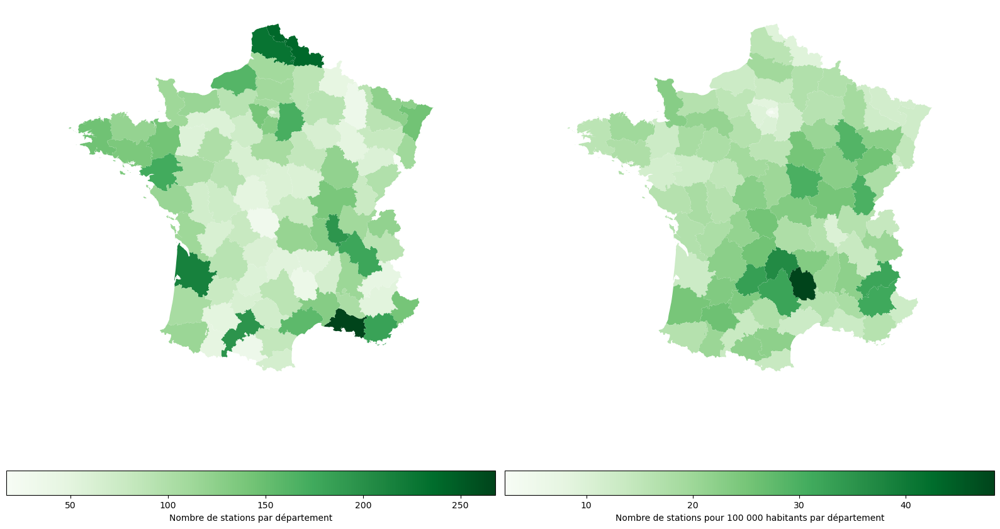

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(16, 9))
axs[0].axis('off')
axs[1].axis('off')
gdf_merge.plot(column='id', ax=axs[0], legend=True,
               legend_kwds={'label': "Nombre de stations par département",
                            'orientation': "horizontal"},cmap='Greens')

gdf_stations_par_hab.plot(column='Stations_pour_100k_hab', ax=axs[1], legend=True,
               legend_kwds={'label': "Nombre de stations pour 100 000 habitants par département",
                            'orientation': "horizontal"},cmap='Greens')
plt.tight_layout()
plt.savefig('graph/répartition_stations_départements.png',bbox_inches='tight')
plt.show()

In [33]:
gdf_dep_merge

,code_insee,geometry,cp,nom_carburant,valeur
0,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,E85,0.686455
1,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,GPLc,0.687420
2,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,Gazole,1.081977
3,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP95,0.949783
4,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP95-E10,0.932652
...,...,...,...,...,...
559,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,GPLc,0.651042
560,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,Gazole,1.085214
561,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,SP95,0.953559
562,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,SP95-E10,0.959443


In [34]:
gdf_dep_merge_merge=gdf_dep_merge[~((gdf_dep_merge['nom_carburant']=='E85')|(gdf_dep_merge['nom_carburant']=='GPLc')|(gdf_dep_merge['nom_carburant']=='SP95'))]
gdf_dep_merge_merge

,code_insee,geometry,cp,nom_carburant,valeur
2,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,Gazole,1.081977
4,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP95-E10,0.932652
5,01,"POLYGON ((5.25559 45.78459, 5.23987 45.77758, ...",01,SP98,1.002545
8,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ...",02,Gazole,1.061472
10,02,"POLYGON ((3.48175 48.86640, 3.48647 48.85768, ...",02,SP95-E10,0.937621
...,...,...,...,...,...
556,94,"POLYGON ((2.41450 48.71780, 2.41573 48.72088, ...",94,SP95-E10,0.959233
557,94,"POLYGON ((2.41450 48.71780, 2.41573 48.72088, ...",94,SP98,1.027581
560,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,Gazole,1.085214
562,95,"POLYGON ((1.79674 49.07196, 1.79991 49.06425, ...",95,SP95-E10,0.959443


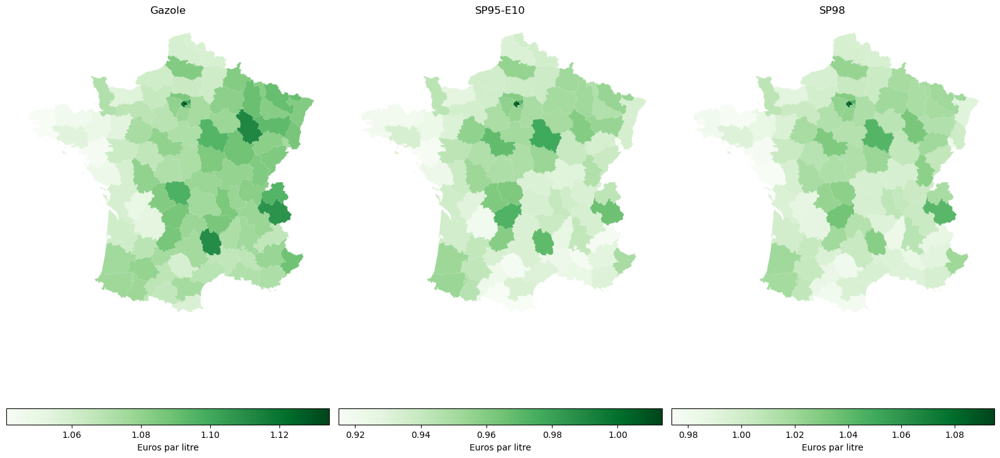

In [35]:
n_lignes=1
n_colonnes=3
compte=0
carburants = gdf_dep_merge_merge['nom_carburant'].unique()
fig, axs = plt.subplots(1, 3, figsize=(16, 9))
for j in range(n_colonnes):
        ax=axs[j]
        if compte<len(carburants):
            carburant=carburants[compte]
            gdf_dep_filtre=gdf_dep_merge_merge[gdf_dep_merge_merge['nom_carburant']==carburant]
            gdf_dep_filtre.plot(column='valeur',ax=ax,legend=True,cmap='Greens',
                                  legend_kwds={'label':'Euros par litre',
                                      
                                        'orientation': "horizontal"})
            ax.axis('off')
            compte+=1
            ax.set_title(carburant)
plt.tight_layout()
plt.savefig('graph/prix_carburants_par_département.png')
plt.show()